In [1]:
import numpy as np
import cv2 as cv
import os
import matplotlib.pyplot as plt
import imutils
np.set_printoptions(suppress=True)

#### Keypoint Extraction

Source: https://docs.opencv.org/4.x/da/df5/tutorial_py_sift_intro.html

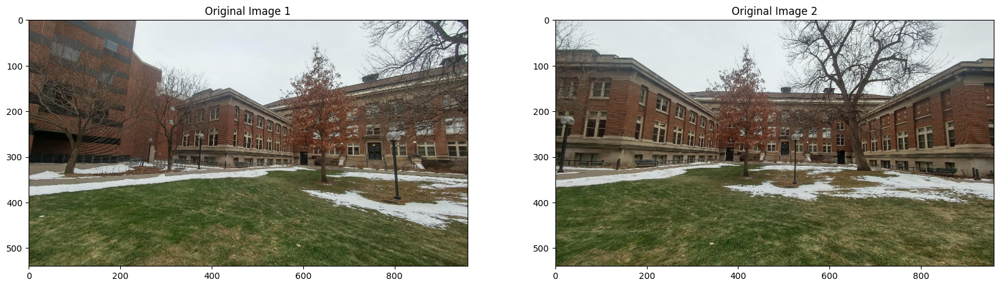

In [2]:
image1 = cv.imread('panaroma_generation/1.jpg')
image2 = cv.imread('panaroma_generation/2.jpg')
# plot 
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(cv.cvtColor(image1, cv.COLOR_BGR2RGB))
plt.title('Original Image 1')
plt.subplot(1, 2, 2)
plt.imshow(cv.cvtColor(image2, cv.COLOR_BGR2RGB))
plt.title('Original Image 2')
plt.show()

In [3]:
# detecting keypoints and descriptors using SIFT algorithm
def keypoint_detection(image1, image2):
    gray1 = cv.cvtColor(image1, cv.COLOR_BGR2GRAY)
    gray2 = cv.cvtColor(image2, cv.COLOR_BGR2GRAY)
    sift = cv.SIFT_create()
    keypoints1, descriptors1 = sift.detectAndCompute(gray1, None)
    keypoints2, descriptors2 = sift.detectAndCompute(gray2, None)
    return keypoints1, descriptors1, keypoints2, descriptors2

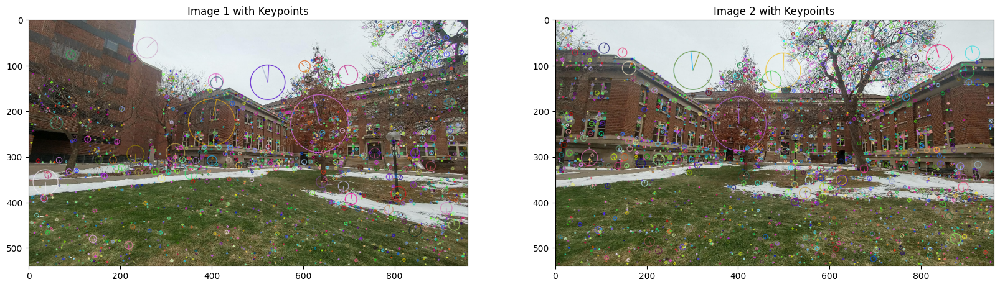

In [4]:
keypoints1, descriptors1, keypoints2, descriptors2 = keypoint_detection(image1, image2)
# drawing keypoints on the images
img1 = cv.drawKeypoints(image1, keypoints1, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2 = cv.drawKeypoints(image2, keypoints2, None, flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
# change to RGB
img1 = cv.cvtColor(img1, cv.COLOR_BGR2RGB)
img2 = cv.cvtColor(img2, cv.COLOR_BGR2RGB)
# plotting the images
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.imshow(img1)
plt.title('Image 1 with Keypoints')
plt.subplot(1, 2, 2)
plt.imshow(img2)
plt.title('Image 2 with Keypoints')
plt.show()

#### Flann-Based Feature Matching

Source: https://docs.opencv.org/3.4/d5/d6f/tutorial_feature_flann_matcher.html

In [5]:
# Flann-Based feature matching using SIFT descriptors and keypoints
def flann_matching(keypoints1, descriptors1, keypoints2, descriptors2):
    flann_matcher = cv.DescriptorMatcher_create(cv.DescriptorMatcher_FLANNBASED)
    knn_flann_matches = flann_matcher.knnMatch(descriptors1, descriptors2, 2)
    # ratio test
    ratio_thresh = 0.7
    good_flann_matches = []
    for m, n in knn_flann_matches:
        if m.distance < ratio_thresh * n.distance:
            good_flann_matches.append(m)
    return good_flann_matches

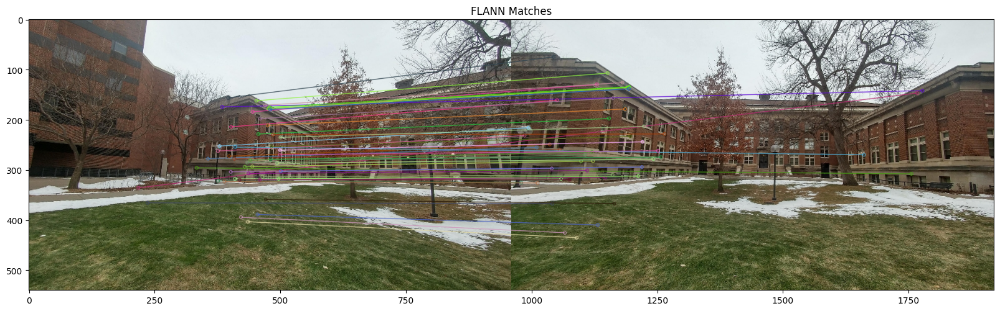

In [6]:
good_flann_matches = flann_matching(keypoints1, descriptors1, keypoints2, descriptors2)
# drawing the matches between the images
img_flann_matches = cv.drawMatches(image1, keypoints1, image2, keypoints2, good_flann_matches[:50], None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
img_flann_matches = cv.cvtColor(img_flann_matches, cv.COLOR_BGR2RGB)
plt.figure(figsize=(20, 10))
plt.imshow(img_flann_matches)
plt.title('FLANN Matches')
plt.show()

#### Brute-Force Feature Matching

Source: https://docs.opencv.org/4.x/dc/dc3/tutorial_py_matcher.html

In [7]:
# Brute-Force Matching using SIFT descriptors and keypoints
def brute_force_matching(descriptors1, descriptors2):
    brute_force = cv.BFMatcher(cv.NORM_L2, crossCheck=True)
    bf_matches = brute_force.match(descriptors1, descriptors2)
    bf_matches = sorted(bf_matches, key=lambda x: x.distance) 
    return bf_matches

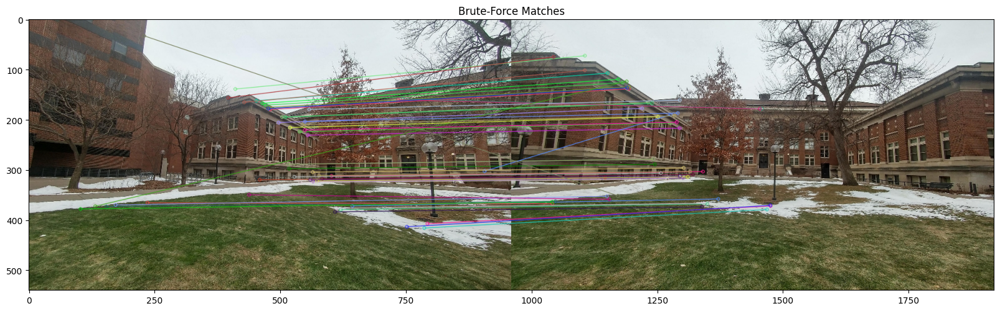

In [8]:
bf_matches = brute_force_matching(descriptors1, descriptors2)
# drawing the matches between the images
img_bf_matches = cv.drawMatches(image1, keypoints1, image2, keypoints2, bf_matches[:50], None, flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
img_bf_matches = cv.cvtColor(img_bf_matches, cv.COLOR_BGR2RGB)
# plotting the brute-force matched images
plt.figure(figsize=(20, 10))
plt.imshow(img_bf_matches)
plt.title('Brute-Force Matches')
plt.show()

#### Homography Estimation

Source: https://docs.opencv.org/3.4/d1/de0/tutorial_py_feature_homography.html

In [9]:
def homography_computation(keypoints1, keypoints2, descriptors1, descriptors2, good_flann_matches):
    point1 = np.float32([keypoints1[m.queryIdx].pt for m in good_flann_matches]).reshape(-1, 1, 2)
    point2 = np.float32([keypoints2[m.trainIdx].pt for m in good_flann_matches]).reshape(-1, 1, 2)
    H, mask = cv.findHomography(point2, point1, cv.RANSAC, 5.0)
    return point2, point1, H, mask

In [10]:
src_pts, dst_pts, H, mask = homography_computation(keypoints1, keypoints2, descriptors1, descriptors2, good_flann_matches) 
print(f"Homography Matrix:\n{H}") 

Homography Matrix:
[[ -0.01801127  -0.02168112 363.35437656]
 [ -0.30106695   0.5486864  128.70740944]
 [ -0.00100491  -0.00012691   1.        ]]


#### Perspective Warping

Source: https://theailearner.com/tag/cv2-warpperspective/

In [11]:
def perspective_warp(img1, img2, H):
    height, width = img1.shape[:2]
    warped_image1 = img1.copy()
    warped_image2 = cv.warpPerspective(img2, H, (width*2, height))
    warped_image2 = cv.resize(warped_image2, (width, height))
    # Warped image 1 and 2 after reshaping to original size of the image
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(cv.cvtColor(warped_image1, cv.COLOR_BGR2RGB))
    plt.title('Warped Image 1')
    plt.subplot(1, 2, 2)
    plt.imshow(cv.cvtColor(warped_image2, cv.COLOR_BGR2RGB))
    plt.title('Warped Image 2')
    plt.show()
    # Warped image 1 and 2 without reshaping
    warped_image2 = cv.resize(warped_image2, (width*2, height))
    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(cv.cvtColor(warped_image1, cv.COLOR_BGR2RGB))
    plt.title('Warped Image 1')
    plt.subplot(1, 2, 2)
    plt.imshow(cv.cvtColor(warped_image2, cv.COLOR_BGR2RGB))
    plt.title('Warped Image 2')
    plt.show()

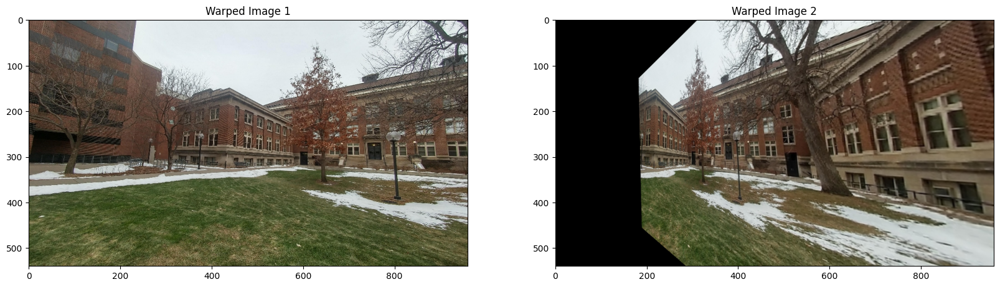

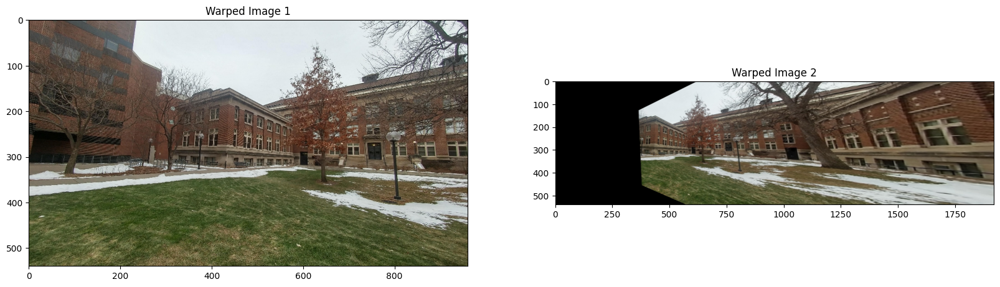

In [12]:
perspective_warp(image1, image2, H)

#### Stiching


##### Without Cropping and Blending

In [13]:
# stitching two images together using homography matrix without cropping and blending
def no_crop_blend_stitch(img1, img2, H):
    width_panaroma = img1.shape[1] + img2.shape[1]
    height_panaroma = img1.shape[0]
    warped_image2 = cv.warpPerspective(img2, H, (width_panaroma, height_panaroma))
    # superimpose the image 1 on the warped image 2
    warped_image2[0:img1.shape[0], 0:img1.shape[1]] = img1
    # plot the panaroma generated without cropping and blending
    plt.figure(figsize=(20, 10))
    plt.imshow(cv.cvtColor(warped_image2, cv.COLOR_BGR2RGB))
    plt.title('Panaroma of Image 1 and 2 without Cropping and Blending')
    plt.show()

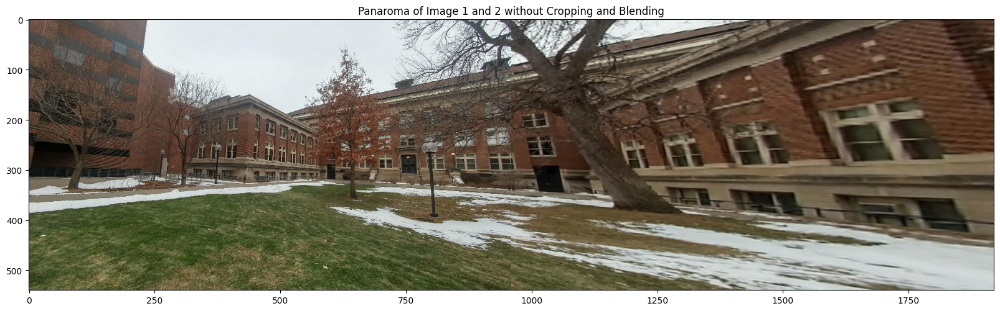

In [14]:
no_crop_blend_stitch(image1, image2, H)

##### With Cropping and Blending

In [15]:
def crop_blend_stitch(img1, img2, H):
    width_panaroma = img1.shape[1]
    height_panaroma = img1.shape[0]
    warped_image2 = cv.warpPerspective(img2, H, (width_panaroma, height_panaroma))
    # blend images
    blended_image = cv.addWeighted(warped_image2, 0.5, img1, 0.5, 0)
    # find the contours of the blended image
    gray = cv.cvtColor(blended_image, cv.COLOR_BGR2GRAY)
    _, thresh = cv.threshold(gray, 1, 255, cv.THRESH_BINARY)
    contours, _ = cv.findContours(thresh, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    # find the bounding box of the contours
    x, y, w, h = cv.boundingRect(contours[0])
    # crop the blended image
    cropped_panaroma = blended_image[y:y+h, x:x+w]
    # plot the cropped and blended panaroma
    plt.figure(figsize=(20, 10))
    plt.imshow(cv.cvtColor(cropped_panaroma, cv.COLOR_BGR2RGB))
    plt.title('Panaroma of Image 1 and 2 with Cropping and Blending')
    plt.show() 

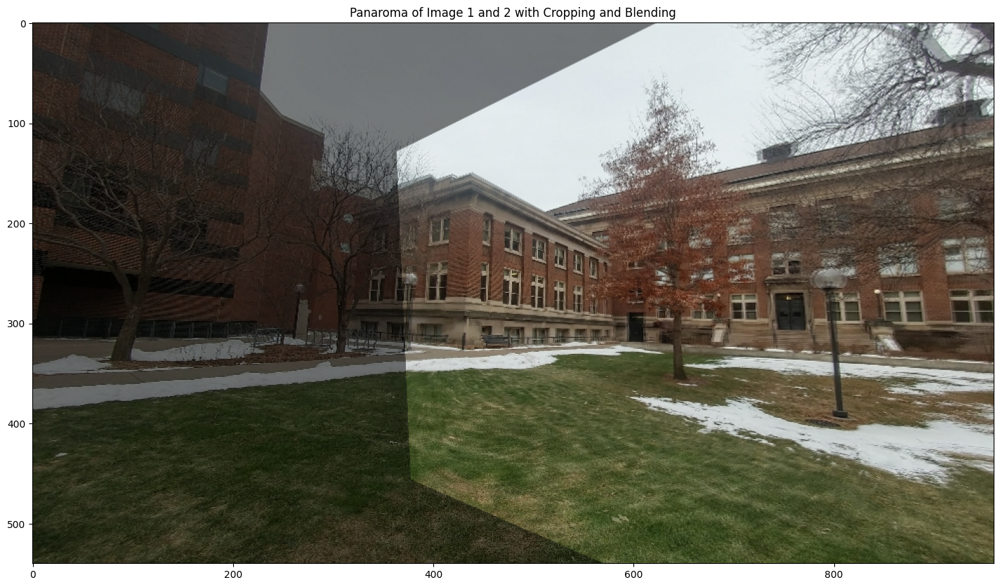

In [16]:
crop_blend_stitch(image1, image2, H)

#### Multi-stitching

Source: https://www.youtube.com/watch?v=Zs51cg4mb0k&ab_channel=NicolaiNielsen

In [17]:
def blend_and_crop(panaroma):
    stitched_img = cv.copyMakeBorder(panaroma, 10, 10, 10, 10, cv.BORDER_CONSTANT, value=[0, 0, 0])
    gray = cv.cvtColor(stitched_img, cv.COLOR_BGR2GRAY)
    threshold = cv.threshold(gray, 0, 255, cv.THRESH_BINARY)[1]
    contours = cv.findContours(threshold.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    contours = imutils.grab_contours(contours)
    areaOI = max(contours, key=cv.contourArea)
    mask = np.zeros(threshold.shape, dtype='uint8')
    x, y, w, h = cv.boundingRect(areaOI)
    cv.rectangle(mask, (x, y), (x + w, y + h), (255, 255, 255), -1)
    minRectangle = mask.copy()
    sub = mask.copy()
    while cv.countNonZero(sub) > 0:
        minRectangle = cv.erode(minRectangle, None)
        sub = cv.subtract(minRectangle, threshold)
    contours = cv.findContours(minRectangle.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    contours = imutils.grab_contours(contours)
    areaOI = max(contours, key=cv.contourArea)
    x, y, w, h = cv.boundingRect(areaOI)
    stitched_img = stitched_img[y:y + h, x:x + w]
    return stitched_img

In [18]:
def multi_stitching(images):
    stitcher = cv.Stitcher_create()
    status, panaroma = stitcher.stitch(images)
    if not status:
        # plot the panaroma generated using multi-image stitching
        plt.figure(figsize=(20, 10))
        plt.imshow(cv.cvtColor(panaroma, cv.COLOR_BGR2RGB))
        plt.title('Panaroma of Multiple Images without Cropping and Blending')
        plt.show()
        # perform blending and cropping
        cropped_panaroma = blend_and_crop(panaroma)
        # plot the cropped and blended panaroma
        plt.figure(figsize=(20, 10))
        plt.imshow(cv.cvtColor(cropped_panaroma, cv.COLOR_BGR2RGB))
        plt.title('Panaroma of Multiple Images with Cropping and Blending')
        plt.show()

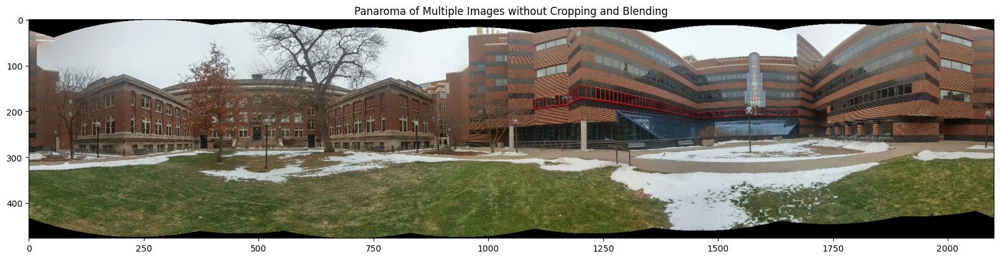

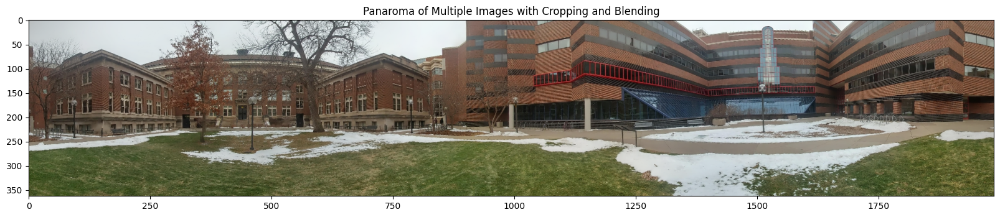

In [20]:
image_paths = []
for file in os.listdir('panaroma_generation'):
    if file.endswith('.jpg'):
        image_paths.append('panaroma_generation/' + file)
images = [cv.imread(image) for image in image_paths]
multi_stitching(images) 